In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import shap
from sklearn.ensemble import RandomForestRegressor

/home/ethan/anaconda3/envs/automation-project-2024/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Ideas:

 - PCA and plotting of principal components
 - feature importance on a simple random forest to indicate if there are main informative features or well distributed
 - pairwise plots (correlation btwn features)
 


In [2]:
data = pd.read_csv('inhibition_features.csv')
y = data['% Control']
X = data.drop(columns=['Unnamed: 0','Protein HMS LINCS ID','% Control'])
X

,pr_modifications,pr_production_source_organism,Beta_Sheet,Alpha_Helix,A_Percentage,R_Percentage,N_Percentage,D_Percentage,C_Percentage,Q_Percentage,...,S_Percentage,T_Percentage,W_Percentage,Y_Percentage,V_Percentage,Isoelectric_Point,Molecular_Weight,Aromaticity,Instability_Index,GRAVY
0,0,0,0.235172,0.283039,0.082206,0.033299,0.034339,0.046826,0.013528,0.116545,...,0.083247,0.064516,0.003122,0.015609,0.053070,6.158641,103883.7165,0.053070,56.527596,-0.519667
1,1,0,0.232743,0.299115,0.085841,0.056637,0.035398,0.037168,0.012389,0.029204,...,0.106195,0.057522,0.011504,0.026549,0.054867,8.918315,122870.1427,0.063717,51.975673,-0.597522
2,0,0,0.232743,0.299115,0.085841,0.056637,0.035398,0.037168,0.012389,0.029204,...,0.106195,0.057522,0.011504,0.026549,0.054867,8.841468,122837.0682,0.062832,52.229655,-0.595664
3,1,0,0.232743,0.299115,0.085841,0.056637,0.035398,0.037168,0.012389,0.029204,...,0.106195,0.057522,0.011504,0.026549,0.054867,8.841468,122837.0682,0.062832,52.229655,-0.595664
4,0,0,0.232743,0.299115,0.085841,0.056637,0.035398,0.037168,0.012389,0.029204,...,0.106195,0.057522,0.011504,0.026549,0.054867,8.841468,122837.0682,0.062832,52.059212,-0.596283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449,0,0,0.273457,0.305556,0.068519,0.053086,0.040123,0.036420,0.023457,0.038889,...,0.086420,0.045679,0.020370,0.023457,0.055556,6.669340,176500.0031,0.075926,51.074451,-0.299568
450,0,0,0.272222,0.305556,0.068519,0.053086,0.040123,0.036420,0.024074,0.038889,...,0.086420,0.045679,0.020370,0.022840,0.055556,6.669055,176458.0112,0.075309,51.120994,-0.298395
451,0,0,0.313140,0.225256,0.058020,0.052901,0.050341,0.045222,0.014505,0.047782,...,0.090444,0.046928,0.009386,0.032423,0.052901,6.345073,133257.3249,0.073379,47.430043,-0.387884
452,0,0,0.246040,0.290391,0.073918,0.051742,0.022175,0.031679,0.024287,0.051742,...,0.093981,0.034847,0.015839,0.016895,0.052798,7.770652,104040.3428,0.058078,59.962302,-0.529250


Pairplot of features to show correlation

In [5]:
sns.pairplot(X)

PCA and visualization of 1st 2 principal components

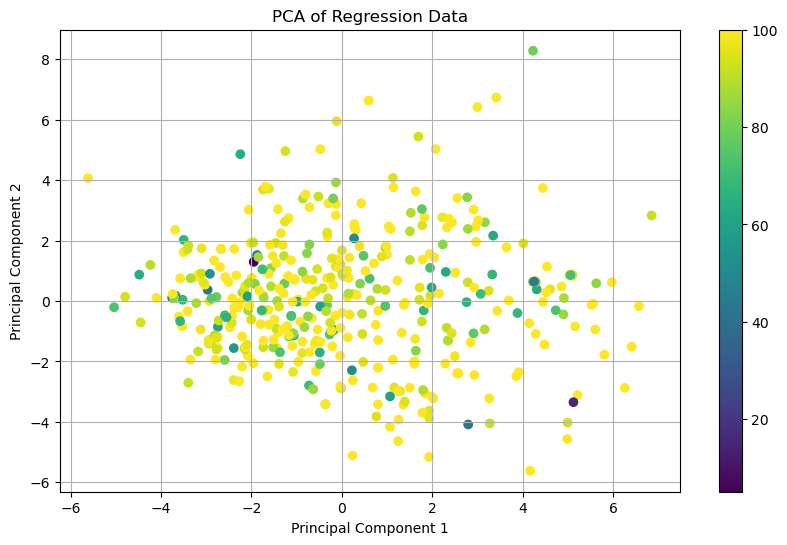

In [4]:
#scale X to make PCA better
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#pca
pca = PCA(n_components=2) 
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)
principal_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
final_df = pd.concat([principal_df, y], axis=1)

#plot and color points based on y
plt.figure(figsize=(10, 6))
plt.scatter(final_df['PC1'], final_df['PC2'], c=y, cmap='viridis')
plt.title('PCA of Regression Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar()
plt.grid(True)
plt.show()

In [5]:
print(type(X_pca))

<class 'numpy.ndarray'>


In [6]:
pca.explained_variance_ratio_

array([0.22833395, 0.14210708])

In [8]:
n_components=2
pca = PCA(n_components=n_components)
pca.fit(X_scaled) 
while sum(pca.explained_variance_ratio_) < 0.9:
    print(f'n_components={n_components}: sum(pca.explained_variance_ratio_)={sum(pca.explained_variance_ratio_)}')
    #pca
    pca = PCA(n_components=n_components) 
    pca.fit(X_scaled)
    n_components += 1
# print(f"BEST: n_components={n_components-1}")
X_pca = pca.transform(X_scaled)

# import os
# print(os.getcwd())
file_location = '../../P_ALICE/pretransformations/'
file_name = 'inhibition_pretransformation_nonlinear_2.npy'
try:
    np.load(file_location + file_name)
    print('dont need to remake')
except:
    print('saving result')
    np.save(file_location + file_name, X_pca)
    print(X_pca.shape)

n_components=2: sum(pca.explained_variance_ratio_)=0.3704410299996865
n_components=3: sum(pca.explained_variance_ratio_)=0.3704410299996865
n_components=4: sum(pca.explained_variance_ratio_)=0.46550617201469724
n_components=5: sum(pca.explained_variance_ratio_)=0.5407404750831102
n_components=6: sum(pca.explained_variance_ratio_)=0.6014739857815313
n_components=7: sum(pca.explained_variance_ratio_)=0.6479641573889655
n_components=8: sum(pca.explained_variance_ratio_)=0.6879638343164639
n_components=9: sum(pca.explained_variance_ratio_)=0.7232446719112389
n_components=10: sum(pca.explained_variance_ratio_)=0.7564402606664529
n_components=11: sum(pca.explained_variance_ratio_)=0.7874357228933208
n_components=12: sum(pca.explained_variance_ratio_)=0.8148840066271719
n_components=13: sum(pca.explained_variance_ratio_)=0.8402273472009039
n_components=14: sum(pca.explained_variance_ratio_)=0.8636136870653792
n_components=15: sum(pca.explained_variance_ratio_)=0.8849263452947759
saving result

feature importance

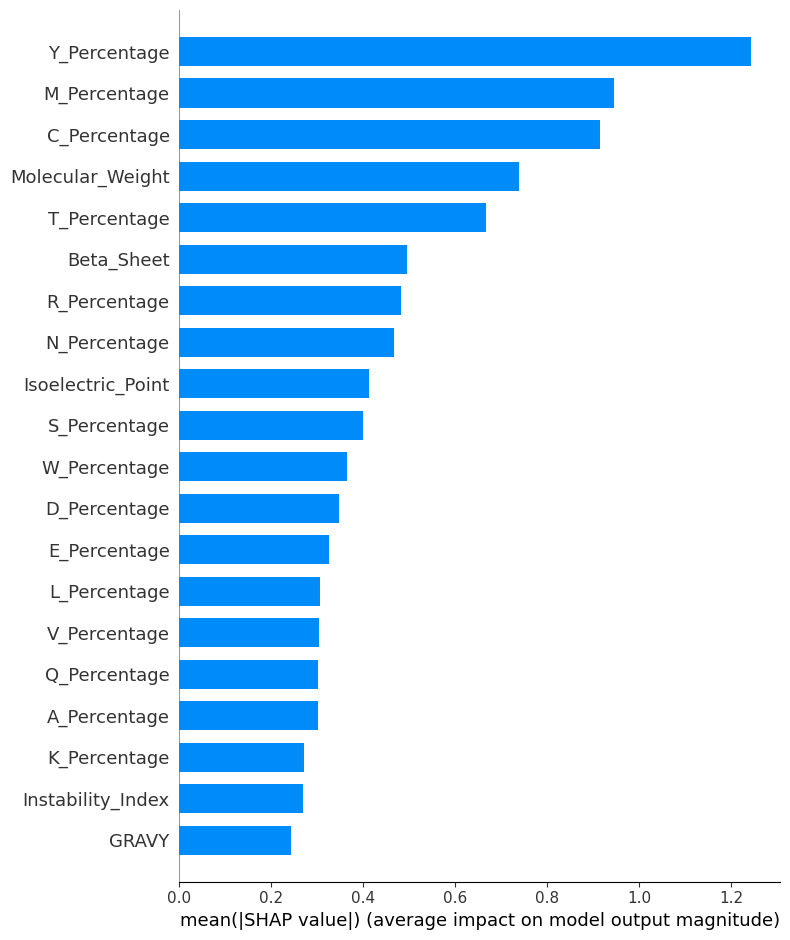

In [7]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y)

# Initialize a SHAP explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values
explanation = explainer(X)
shap_values = explanation.values

# Summary plot of feature importances
shap.summary_plot(shap_values, X,feature_names=X.columns, plot_type="bar")

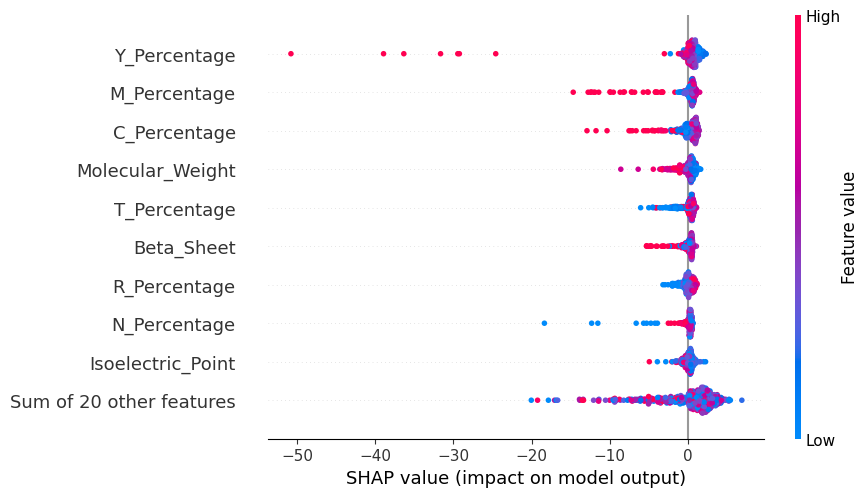

In [9]:
shap.plots.beeswarm(explanation)

Correlation

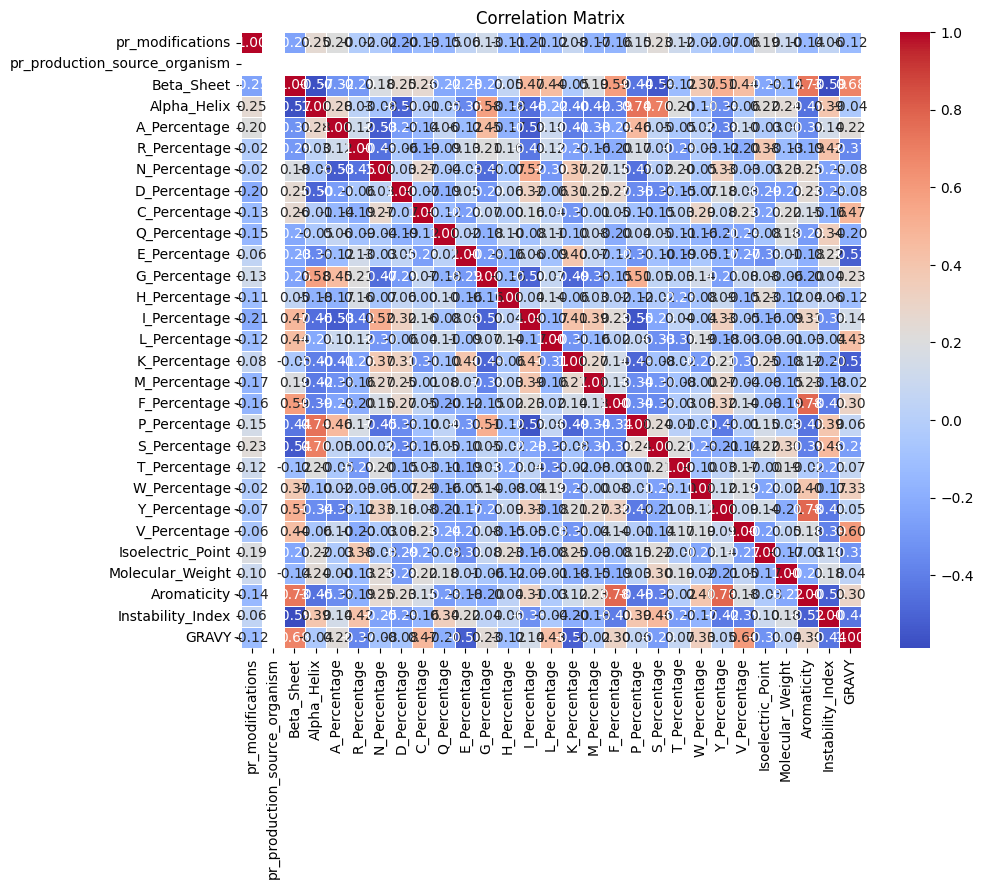

In [10]:
correlation_matrix = X.corr()


plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

Distribution of y

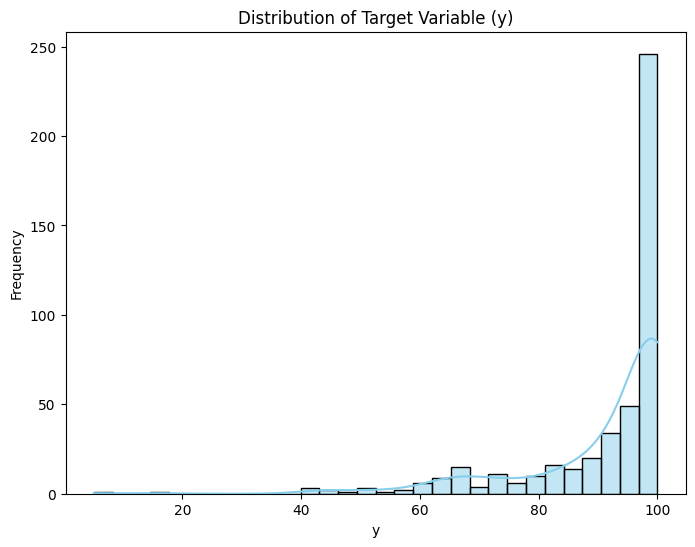

In [11]:
plt.figure(figsize=(8, 6))
sns.histplot(data['% Control'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Target Variable (y)')
plt.xlabel('y')
plt.ylabel('Frequency')
plt.show()